# Estimations de l’incidence brute et ajustée

In [1]:
# Set SNT Paths
SNT_ROOT_PATH  <- "~/workspace"
CODE_PATH      <- file.path(SNT_ROOT_PATH, "code")
CONFIG_PATH    <- file.path(SNT_ROOT_PATH, "configuration")

# load util functions
source(file.path(CODE_PATH, "snt_utils.r"))

# List required packages 
required_packages <- c("dplyr", "tidyr", "terra", "ggplot2", "stringr", "lubridate", "viridis", "patchwork", "zoo", "purrr", "arrow", "sf", "reticulate", "leaflet")

# Execute function
install_and_load(required_packages)

# Set environment to load openhexa.sdk from the right environment
Sys.setenv(RETICULATE_PYTHON = "/opt/conda/bin/python")
reticulate::py_config()$python
openhexa <- import("openhexa.sdk")

# Load SNT config
config_json <- tryCatch({ jsonlite::fromJSON(file.path(CONFIG_PATH, "SNT_config.json"))},
    error = function(e) {
        msg <- paste0("Error while loading configuration", conditionMessage(e))  
        cat(msg)   
        stop(msg) 
    })

# Required environment for the sf packages
Sys.setenv(PROJ_LIB = "/opt/conda/share/proj")
Sys.setenv(GDAL_DATA = "/opt/conda/share/gdal")

              dplyr               tidyr               terra             ggplot2 
      "dplyr 1.1.4"       "tidyr 1.3.1"      "terra 1.8.42"     "ggplot2 3.5.2" 
            stringr           lubridate             viridis           patchwork 
    "stringr 1.5.1"   "lubridate 1.9.4"     "viridis 0.6.5"   "patchwork 1.3.1" 
                zoo               purrr               arrow                  sf 
       "zoo 1.8.14"       "purrr 1.0.4"      "arrow 18.1.0"         "sf 1.0.20" 
         reticulate             leaflet 
"reticulate 1.43.0"     "leaflet 2.2.2" 


[1] "/opt/conda/bin/python"

In [2]:
# Configuration variables
DATASET_NAME <- config_json$SNT_DATASET_IDENTIFIERS$DHIS2_INCIDENCE
COUNTRY_CODE <- config_json$SNT_CONFIG$COUNTRY_CODE
ADM_2 <- toupper(config_json$SNT_CONFIG$DHIS2_ADMINISTRATION_2)

In [3]:
# print function
printdim <- function(df, name = deparse(substitute(df))) {
  cat("Dimensions of", name, ":", nrow(df), "rows x", ncol(df), "columns\n\n")
}

In [4]:
# import DHIS2 shapes data
DATASET_DHIS2 <- config_json$SNT_DATASET_IDENTIFIERS$DHIS2_DATASET_FORMATTED
shapes_data <- tryCatch({ get_latest_dataset_file_in_memory(DATASET_DHIS2, paste0(COUNTRY_CODE, "_shapes.geojson")) }, 
                  error = function(e) {
                      msg <- paste("Error while loading DHIS2 Shapes data for: " , COUNTRY_CODE, conditionMessage(e))
                      cat(msg)
                      stop(msg)
                      })

pyramid_data <- tryCatch({ get_latest_dataset_file_in_memory(DATASET_DHIS2, paste0(COUNTRY_CODE, "_pyramid.parquet")) }, 
                  error = function(e) {
                      msg <- paste("Error while loading DHIS2 Shapes data for: " , COUNTRY_CODE, conditionMessage(e))
                      cat(msg)
                      stop(msg)
                      })
pyramid_data <- pyramid_data %>%
  select(LEVEL_3_ID, LEVEL_3_NAME, LEVEL_2_NAME, LEVEL_1_NAME) %>%
  distinct()

[1] "File downloaded successfully from dataset version: COD_snt_20250708_1544"
[1] "File downloaded successfully from dataset version: COD_snt_20250708_1544"


## Incidence du paludisme par année par district sanitaire

In [5]:
# import data
incidence_data <- tryCatch({ get_latest_dataset_file_in_memory(DATASET_NAME, paste0(COUNTRY_CODE, "_incidence_year_routine-data-raw_rr-method-conf.parquet")) }, 
                  error = function(e) {
                      msg <- paste("Error while loading seasonality file for: " , COUNTRY_CODE, conditionMessage(e))
                      cat(msg)
                      stop(msg)
                      })

ADM_2_ID <- gsub("_NAME", "_ID", ADM_2)
incidence_data <- incidence_data %>%
  left_join(pyramid_data, by = setNames(ADM_2_ID, "ADM2_ID"))

printdim(incidence_data)
head(incidence_data)

[1] "File downloaded successfully from dataset version: COD_snt_20250721_1138"
Dimensions of incidence_data : 1557 rows x 17 columns



ADM2_ID,YEAR,CONF,N1,N2,ADM1_NAME,ADM1_ID,ADM2_NAME,POPULATION,INCIDENCE_CRUDE,INCIDENCE_ADJ_TESTING,INCIDENCE_ADJ_REPORTING,N3,INCIDENCE_ADJ_CARESEEKING,LEVEL_3_NAME,LEVEL_2_NAME,LEVEL_1_NAME
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
ADqfcJ05GHD,2022,24357,24740.22,27230.83,KC KONGO CENTRAL PROVINCE,dKdrd8HqZWz,KC KITONA ZONE DE SANTE,117025,208.1350,211.4097,232.6924,145416.2,1242.6079,KC KITONA ZONE DE SANTE,KC KONGO CENTRAL PROVINCE,REPUBLIQUE DEMOCRATIQUE DU CONGO
ADqfcJ05GHD,2023,28951,29138.75,31787.73,KC KONGO CENTRAL PROVINCE,dKdrd8HqZWz,KC KITONA ZONE DE SANTE,120535,240.1875,241.7452,263.7220,169750.7,1408.3101,KC KITONA ZONE DE SANTE,KC KONGO CENTRAL PROVINCE,REPUBLIQUE DEMOCRATIQUE DU CONGO
ADqfcJ05GHD,2024,21804,23660.29,27080.75,KC KONGO CENTRAL PROVINCE,dKdrd8HqZWz,KC KITONA ZONE DE SANTE,124148,175.6291,190.5814,218.1328,144614.7,1164.8577,KC KITONA ZONE DE SANTE,KC KONGO CENTRAL PROVINCE,REPUBLIQUE DEMOCRATIQUE DU CONGO
AH4FtBD4MqK,2022,51605,74976.67,107683.73,KR KASAI CENTRAL PROVINCE,I8CuQpdBQfP,KR TSHIBALA ZONE DE SANTE,303762,169.8863,246.8270,354.5003,373486.7,1229.5373,KR TSHIBALA ZONE DE SANTE,KR KASAI CENTRAL PROVINCE,REPUBLIQUE DEMOCRATIQUE DU CONGO
AH4FtBD4MqK,2023,59421,63958.44,72641.98,KR KASAI CENTRAL PROVINCE,I8CuQpdBQfP,KR TSHIBALA ZONE DE SANTE,312689,190.0323,204.5433,232.3138,251949.1,805.7497,KR TSHIBALA ZONE DE SANTE,KR KASAI CENTRAL PROVINCE,REPUBLIQUE DEMOCRATIQUE DU CONGO
AH4FtBD4MqK,2024,88520,89517.85,90620.29,KR KASAI CENTRAL PROVINCE,I8CuQpdBQfP,KR TSHIBALA ZONE DE SANTE,322260,274.6850,277.7814,281.2024,314304.4,975.3132,KR TSHIBALA ZONE DE SANTE,KR KASAI CENTRAL PROVINCE,REPUBLIQUE DEMOCRATIQUE DU CONGO


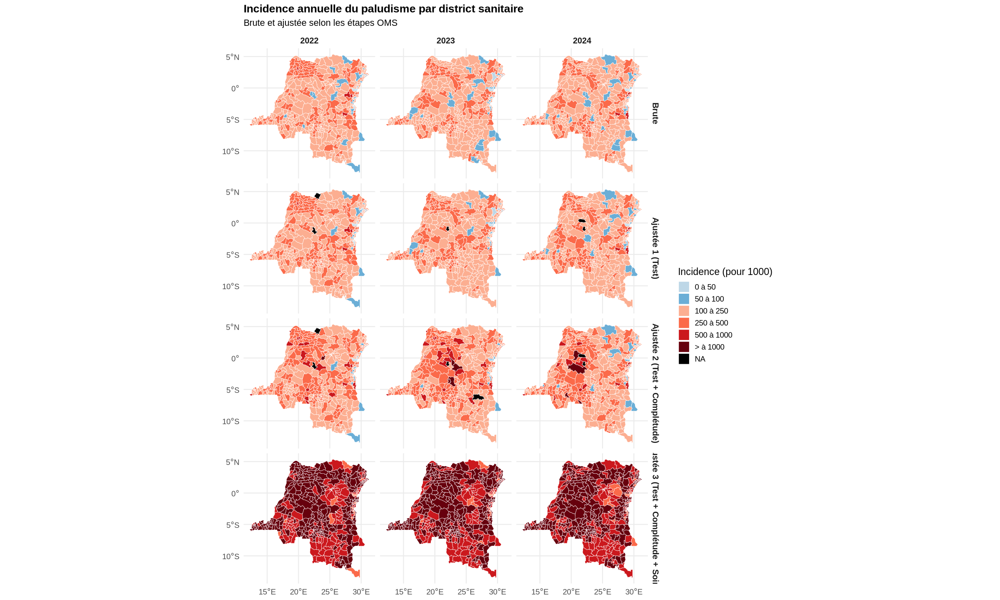

In [6]:
# Step 1: Prepare long-form data
incidence_long <- incidence_data %>%
  select(ADM2_ID, YEAR, POPULATION,
         INCIDENCE_CRUDE,
         INCIDENCE_ADJ_TESTING,
         INCIDENCE_ADJ_REPORTING,
         INCIDENCE_ADJ_CARESEEKING) %>%
  pivot_longer(
    cols = starts_with("INCIDENCE"),
    names_to = "INCIDENCE_TYPE",
    values_to = "incidence"
  ) %>%
  mutate(
    incidence_type_label = case_when(
      INCIDENCE_TYPE == "INCIDENCE_CRUDE"             ~ "Brute",
      INCIDENCE_TYPE == "INCIDENCE_ADJ_TESTING"       ~ "Ajustée 1 (Test)",
      INCIDENCE_TYPE == "INCIDENCE_ADJ_REPORTING"     ~ "Ajustée 2 (Test + Complétude)",
      INCIDENCE_TYPE == "INCIDENCE_ADJ_CARESEEKING"   ~ "Ajustée 3 (Test + Complétude + Soins)",
      TRUE ~ INCIDENCE_TYPE
    )
  )

# Step 2: Join with shapefile
map_data_long <- shapes_data %>%
  left_join(incidence_long, by = "ADM2_ID")

# Step 3: Categorize incidence for coloring
map_data_long <- map_data_long %>%
  mutate(
    incidence_cat = case_when(
      is.na(incidence)       ~ "NA",
      incidence < 50         ~ "0 à 50",
      incidence < 100        ~ "50 à 100",
      incidence < 250        ~ "100 à 250",
      incidence < 500        ~ "250 à 500",
      incidence < 1000       ~ "500 à 1000",
      TRUE                   ~ "> à 1000"
    ),
    incidence_cat = factor(incidence_cat, levels = c(
      "0 à 50", "50 à 100", "100 à 250", "250 à 500", "500 à 1000", "> à 1000", "NA"
    )),
    incidence_type_label = factor(incidence_type_label, levels = c(
      "Brute",
      "Ajustée 1 (Test)",
      "Ajustée 2 (Test + Complétude)",
      "Ajustée 3 (Test + Complétude + Soins)"
    ))
  )

# Step 4: Color palette from your map
incidence_colors <- c(
  "0 à 50"      = "#bdd7e7",
  "50 à 100"    = "#6baed6",
  "100 à 250"   = "#fcae91",
  "250 à 500"   = "#fb6a4a",
  "500 à 1000"  = "#cb181d",
  "> à 1000"    = "#67000d",
  "NA"          = "#000000"
)

# Step 5: Plot
options(repr.plot.width = 20, repr.plot.height = 12)
ggplot(map_data_long) +
  geom_sf(aes(fill = incidence_cat), color = "white", size = 0.2) +
  facet_grid(rows = vars(incidence_type_label), cols = vars(YEAR)) +
  scale_fill_manual(values = incidence_colors, name = "Incidence (pour 1000)") +
  labs(
    title = "Incidence annuelle du paludisme par district sanitaire",
    subtitle = "Brute et ajustée selon les étapes OMS"
  ) +
  theme_minimal(base_size = 14) +
  theme(
    strip.text = element_text(face = "bold", size = 12),
    plot.title = element_text(face = "bold", size = 16),
    plot.subtitle = element_text(size = 13),
    legend.position = "right"
  )


## Incidence moyenne du paludisme par district sanitaire (Moyenne annuelle - toutes années confondues)

In [7]:
# Step 1: Compute mean incidence across years
mean_incidence <- incidence_data %>%
  select(ADM2_ID, POPULATION,
         INCIDENCE_CRUDE,
         INCIDENCE_ADJ_TESTING,
         INCIDENCE_ADJ_REPORTING,
         INCIDENCE_ADJ_CARESEEKING) %>%
  pivot_longer(
    cols = starts_with("INCIDENCE"),
    names_to = "INCIDENCE_TYPE",
    values_to = "incidence"
  ) %>%
  group_by(ADM2_ID, INCIDENCE_TYPE) %>%
  summarise(incidence = mean(incidence, na.rm = TRUE), .groups = "drop") %>%
  mutate(
    incidence_type_label = case_when(
      INCIDENCE_TYPE == "INCIDENCE_CRUDE"             ~ "Brute",
      INCIDENCE_TYPE == "INCIDENCE_ADJ_TESTING"       ~ "Ajustée 1 (Test)",
      INCIDENCE_TYPE == "INCIDENCE_ADJ_REPORTING"     ~ "Ajustée 2 (Test + Complétude)",
      INCIDENCE_TYPE == "INCIDENCE_ADJ_CARESEEKING"   ~ "Ajustée 3 (Test + Complétude + Soins)",
      TRUE ~ INCIDENCE_TYPE
    )
  )

# Step 2: Join with shapefile
map_data_mean <- shapes_data %>%
  left_join(mean_incidence, by = "ADM2_ID")

# Step 3: Categorize
map_data_mean <- map_data_mean %>%
  mutate(
    incidence_cat = case_when(
      is.na(incidence)       ~ "NA",
      incidence < 50         ~ "0 à 50",
      incidence < 100        ~ "50 à 100",
      incidence < 250        ~ "100 à 250",
      incidence < 500        ~ "250 à 500",
      incidence < 1000       ~ "500 à 1000",
      TRUE                   ~ "> à 1000"
    ),
    incidence_cat = factor(incidence_cat, levels = c(
      "0 à 50", "50 à 100", "100 à 250", "250 à 500", "500 à 1000", "> à 1000", "NA"
    )),
    incidence_type_label = factor(incidence_type_label, levels = c(
      "Brute",
      "Ajustée 1 (Test)",
      "Ajustée 2 (Test + Complétude)",
      "Ajustée 3 (Test + Complétude + Soins)"
    ))
  )

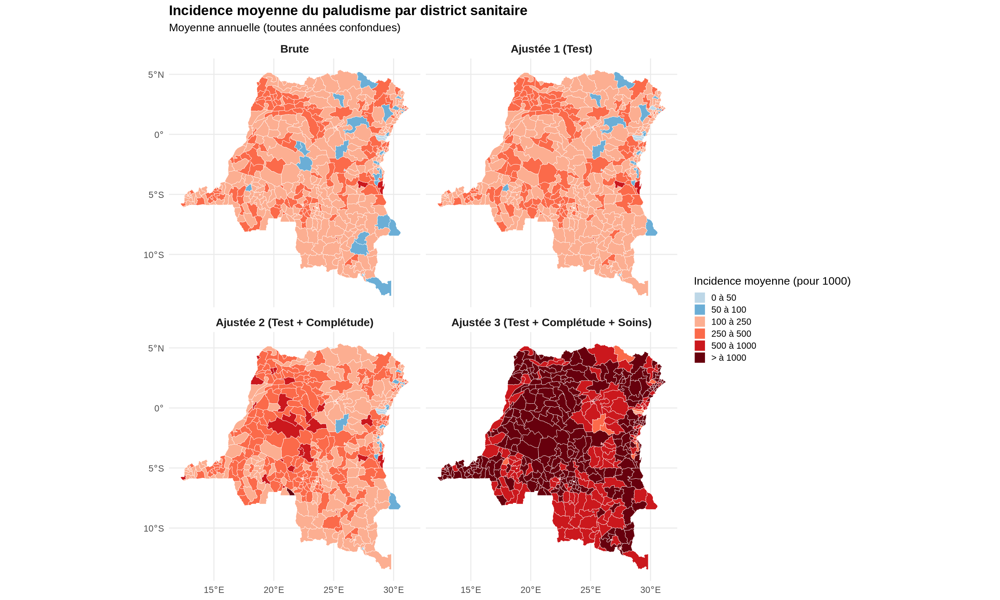

In [8]:
# Step 4: Plot mean incidence
ggplot(map_data_mean) +
  geom_sf(aes(fill = incidence_cat), color = "white", size = 0.2) +
  facet_wrap(~ incidence_type_label) +
  scale_fill_manual(values = incidence_colors, name = "Incidence moyenne (pour 1000)") +
  labs(
    title = "Incidence moyenne du paludisme par district sanitaire",
    subtitle = "Moyenne annuelle (toutes années confondues)",
    x = NULL, y = NULL
  ) +
  theme_minimal(base_size = 16) +
  theme(
    strip.text = element_text(face = "bold", size = 16),
    plot.title = element_text(face = "bold", size = 20),
    plot.subtitle = element_text(size = 16),
    legend.position = "right"
  )